## After new labels came in, and the network was improved technically, I need to explore the networks and get votes.


In [22]:
import numpy as np
import pandas as pd
import utils
import seaborn as sns
import importlib
import warnings
import sklearn
import sklearn.metrics
import matplotlib.pyplot as plt
import fcnnpy
import os
import torch
import torch.nn.functional as F
warnings.filterwarnings("ignore")
importlib.reload(utils)
pd.options.display.max_columns = None
pd.options.display.max_rows = 100

In [2]:
loc="/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/new20cores/"
file="allinfoonnewcores.csv"
modelloc="/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/trimmed/d90s/FCN_models/properAugmentation/"
keepcols=['cx', 'cy', 'Image','global_id', '12d90s', '13d90s', '14d90s', '15d90s', '16d90s', '17d90s','18d90s', '23d90s', '24d90s', '25d90s', '26d90s', '27d90s', '28d90s','34d90s', '35d90s', '36d90s', '37d90s', '38d90s', '45d90s', '46d90s','47d90s', '48d90s', '56d90s', '57d90s', '58d90s', '67d90s', '68d90s','78d90s', 'Class', 'combination','combination_length', 'colorpercell', 'has_GFAP', 'has_mutIDH1', 'has_NeuroC', 'has_TMEM119','has_IBA1', 'has_CD34', 'has_MBP', 'has_Ki67', 'has_NoClass','inv_comb_length', 'CellType', 'ClassLabel', 'is_Astrocyte','is_Glioma', 'is_Neuron', 'is_Microglia', 'is_Macrophage','is_Endothelial','Cell: DAPI mean','Cell: DAPI std dev', 'Cell: DAPI max', 'Cell: DAPI min','Cell: IBA1 mean', 'Cell: IBA1 std dev', 'Cell: IBA1 max','Cell: IBA1 min', 'Cell: Ki67 mean', 'Cell: Ki67 std dev','Cell: Ki67 max', 'Cell: Ki67 min', 'Cell: TMEM119 mean','Cell: TMEM119 std dev', 'Cell: TMEM119 max', 'Cell: TMEM119 min','Cell: NeuroC mean', 'Cell: NeuroC std dev', 'Cell: NeuroC max','Cell: NeuroC min', 'Cell: MBP mean', 'Cell: MBP std dev','Cell: MBP max', 'Cell: MBP min', 'Cell: mutIDH1 mean','Cell: mutIDH1 std dev', 'Cell: mutIDH1 max', 'Cell: mutIDH1 min','Cell: CD34 mean', 'Cell: CD34 std dev', 'Cell: CD34 max','Cell: CD34 min', 'Cell: GFAP mean', 'Cell: GFAP std dev','Cell: GFAP max', 'Cell: GFAP min', 'Cell: Autofluorescence mean','Cell: Autofluorescence std dev', 'Cell: Autofluorescence max','Cell: Autofluorescence min']
featurecols=['12d90s', '13d90s', '14d90s', '15d90s', '16d90s', '17d90s', '18d90s', '23d90s', '24d90s', '25d90s', '26d90s', '27d90s',
             '28d90s', '34d90s', '35d90s', '36d90s', '37d90s', '38d90s', '45d90s', '46d90s', '47d90s', '48d90s', '56d90s', '57d90s',
             '58d90s', '67d90s', '68d90s', '78d90s','Cell: DAPI mean','Cell: DAPI std dev', 'Cell: DAPI max', 'Cell: DAPI min',
             'Cell: IBA1 mean', 'Cell: IBA1 std dev', 'Cell: IBA1 max','Cell: IBA1 min', 'Cell: Ki67 mean', 'Cell: Ki67 std dev',
             'Cell: Ki67 max', 'Cell: Ki67 min', 'Cell: TMEM119 mean','Cell: TMEM119 std dev', 'Cell: TMEM119 max', 
             'Cell: TMEM119 min','Cell: NeuroC mean', 'Cell: NeuroC std dev', 'Cell: NeuroC max','Cell: NeuroC min', 
             'Cell: MBP mean', 'Cell: MBP std dev','Cell: MBP max', 'Cell: MBP min', 'Cell: mutIDH1 mean','Cell: mutIDH1 std dev', 
             'Cell: mutIDH1 max', 'Cell: mutIDH1 min','Cell: CD34 mean', 'Cell: CD34 std dev', 'Cell: CD34 max','Cell: CD34 min',
             'Cell: GFAP mean', 'Cell: GFAP std dev','Cell: GFAP max', 'Cell: GFAP min', 'Cell: Autofluorescence mean',
             'Cell: Autofluorescence std dev', 'Cell: Autofluorescence max','Cell: Autofluorescence min']
numclasses=6

In [5]:
results=pd.read_csv(loc+file)

## We can either take the last or take the "best" interms of trianig loss

In [7]:
#100 models
modelfiles=['model52last-11-0.041276.pth',  'model72last-11-0.043443.pth',  'model84last-11-0.044863.pth',  'model0inter-13-0.046269.pth',  'model32last-11-0.046811.pth',  'model22last-11-0.047213.pth',  'model41last-11-0.047493.pth',  'model17last-11-0.047610.pth',  'model78last-11-0.047922.pth',  'model56last-11-0.048351.pth',  'model58last-11-0.048397.pth',  'model19last-11-0.048432.pth',  'model48last-11-0.048526.pth',  'model4last-11-0.048738.pth',  'model76last-11-0.049190.pth',  'model99last-11-0.050001.pth',  'model12last-11-0.050180.pth',  'model34last-11-0.050212.pth',  'model37last-11-0.050215.pth',  'model13last-11-0.050437.pth',  'model27last-11-0.050473.pth',  'model43last-11-0.050621.pth',  'model73last-11-0.050821.pth',  'model98last-11-0.051024.pth',  'model69last-11-0.051039.pth',  'model14last-11-0.051088.pth',  'model61last-11-0.051161.pth',  'model70last-11-0.051539.pth',  'model7last-11-0.051584.pth',  'model42last-11-0.051753.pth',  'model86last-11-0.052104.pth',  'model18last-11-0.052157.pth',  'model62last-11-0.052350.pth',  'model11last-11-0.052416.pth',  'model66last-11-0.052631.pth',  'model67last-11-0.053010.pth',  'model95last-11-0.053051.pth',  'model23last-11-0.053059.pth',  'model79last-11-0.053483.pth',  'model50last-11-0.053748.pth',  'model75last-11-0.054032.pth',  'model64last-11-0.054077.pth',  'model94last-11-0.054246.pth',  'model83last-11-0.054246.pth',  'model25last-11-0.054305.pth',  'model53last-11-0.054309.pth',  'model81last-11-0.054803.pth',  'model93last-11-0.054819.pth',  'model97last-11-0.054961.pth',  'model90last-11-0.055007.pth',  'model29last-11-0.055120.pth',  'model88last-11-0.055229.pth',  'model89last-11-0.055643.pth',  'model77last-11-0.055660.pth',  'model8last-11-0.055711.pth',  'model6last-11-0.055795.pth',  'model21last-11-0.055800.pth',  'model20last-11-0.055812.pth',  'model40last-11-0.056038.pth',  'model44last-11-0.056148.pth',  'model55last-11-0.056203.pth',  'model47last-11-0.056338.pth',  'model60last-11-0.056459.pth',  'model2inter-8-0.056461.pth',  'model87last-11-0.056794.pth',  'model10last-11-0.056803.pth',  'model33last-11-0.056812.pth',  'model5last-11-0.056821.pth',  'model28last-11-0.057047.pth',  'model51last-11-0.057193.pth',  'model74last-11-0.057247.pth',  'model82last-11-0.057248.pth',  'model68last-11-0.057286.pth',  'model24last-11-0.057306.pth',  'model38last-11-0.057358.pth',  'model16last-11-0.057597.pth',  'model39last-11-0.057782.pth',  'model65last-11-0.057893.pth',  'model15last-11-0.058018.pth',  'model59last-11-0.058125.pth',  'model71last-11-0.058295.pth',  'model49last-11-0.058361.pth',  'model80last-11-0.058641.pth',  'model45last-11-0.058677.pth',  'model31last-11-0.058960.pth',  'model30last-11-0.059345.pth',  'model85last-11-0.059773.pth',  'model63last-11-0.059972.pth',  'model26last-11-0.060228.pth',  'model3last-11-0.060937.pth',  'model57last-11-0.061163.pth',  'model9last-11-0.061316.pth',  'model54last-11-0.061318.pth',  'model96last-11-0.061553.pth',  'model91last-11-0.062075.pth',  'model36last-11-0.063726.pth',  'model35last-11-0.065967.pth',  'model46last-11-0.067201.pth',  'model1inter-9-0.068453.pth',  'model92last-11-0.076010.pth']

In [9]:
allmodels=[]
for fn in modelfiles: 
    model = fcnnpy.Net(len(featurecols), 100,200,300,numclasses)
    model.load_state_dict(torch.load(modelloc+fn))
    model.eval()
    allmodels.append(model)
len(allmodels)

100

In [10]:
X=results[featurecols].to_numpy().astype("float")
X=torch.from_numpy(X)

In [11]:
#reset votes if you want to do inference again
votecols=0
for c in results.columns:
    if "vote" in c:
        results.drop(columns=c,inplace=True)

In [12]:
s=0
for c in results.columns:
    if "vote" in c:
        s+=1
s

0

In [13]:
for i in range(len(allmodels)):
    model=allmodels[i]
    
    output = model(X.float())
    sout= F.log_softmax(output)
    pred=torch.argmax(sout, dim=1)  
    
    pn=pred.cpu().numpy()
    
    results["vote"+str(i)]=pn
    
print("Done") 

Done


## By now I have all the vote for the models in terms of training loss. 
now find modes

In [14]:
cindex={0:'is_Astrocyte', 1:'is_Glioma', 2:'is_Neuron',
     3:'is_Microglia',4:'is_Macrophage', 5:'is_Endothelial'}
colorsHex={"is_Macrophage":"#9467bd","is_Glioma":"#ff7f0e","is_Astrocyte":"#2953b9","is_Neuron":"#ea86d5",
        "is_Endothelial":"#2699b1","is_Microglia":"#ea2325"}
colorsHexByNumbers={4:"#9467bd",1:"#ff7f0e",0:"#2953b9",2:"#ea86d5",
        5:"#2699b1",3:"#ea2325",6:"#aaaaaa"}
colorsRGB={'is_Macrophage': [148, 103, 189], 'is_Glioma': [255, 127, 14], 
           'is_Astrocyte': [41, 83, 185], 'is_Neuron': [234, 134, 213], 
           'is_Endothelial': [38, 153, 177], 'is_Microglia': [234, 35, 37]}

In [15]:
votecols=[]
for c in results.columns:
    if "vote" in c:
        votecols.append(c)
len(votecols)

100

In [16]:
votecols

['vote0',
 'vote1',
 'vote2',
 'vote3',
 'vote4',
 'vote5',
 'vote6',
 'vote7',
 'vote8',
 'vote9',
 'vote10',
 'vote11',
 'vote12',
 'vote13',
 'vote14',
 'vote15',
 'vote16',
 'vote17',
 'vote18',
 'vote19',
 'vote20',
 'vote21',
 'vote22',
 'vote23',
 'vote24',
 'vote25',
 'vote26',
 'vote27',
 'vote28',
 'vote29',
 'vote30',
 'vote31',
 'vote32',
 'vote33',
 'vote34',
 'vote35',
 'vote36',
 'vote37',
 'vote38',
 'vote39',
 'vote40',
 'vote41',
 'vote42',
 'vote43',
 'vote44',
 'vote45',
 'vote46',
 'vote47',
 'vote48',
 'vote49',
 'vote50',
 'vote51',
 'vote52',
 'vote53',
 'vote54',
 'vote55',
 'vote56',
 'vote57',
 'vote58',
 'vote59',
 'vote60',
 'vote61',
 'vote62',
 'vote63',
 'vote64',
 'vote65',
 'vote66',
 'vote67',
 'vote68',
 'vote69',
 'vote70',
 'vote71',
 'vote72',
 'vote73',
 'vote74',
 'vote75',
 'vote76',
 'vote77',
 'vote78',
 'vote79',
 'vote80',
 'vote81',
 'vote82',
 'vote83',
 'vote84',
 'vote85',
 'vote86',
 'vote87',
 'vote88',
 'vote89',
 'vote90',
 'vote91'

In [17]:
mode=results[votecols].mode(axis='columns')
mode

,0,1
0,1.0,NaN
1,1.0,NaN
2,1.0,NaN
3,1.0,NaN
4,1.0,NaN
...,...,...
53852,1.0,NaN
53853,1.0,NaN
53854,1.0,NaN
53855,1.0,NaN


In [18]:
results["fcclass"]=mode[0]


In [53]:
len(onlylabeled)

46673

In [19]:
results["fcclass"].unique()

array([1., 0., 5., 4., 2., 3.])

In [24]:
len(results)-mode[1].isna().sum()

72

In [25]:
len(votecols)

100

In [20]:
results["mode0"]=mode[0].values
results["mode1"]=mode[1].values
results["fcname"]=""
results["fcColorHEX"]=""
results["fcColorRGB"] ="" 
results["fcclass"]=results["mode0"]
fcname ,fcColorHEX ,fcColorRGB=[],[],[]


In [21]:
fcname ,fcColorHEX ,fcColorRGB=[],[],[]
for i, row in results.iterrows():
    gc=int(row["mode0"])
    word=cindex[gc]
    #onlylabeled.loc[i,"fcclass"]=gc
    fcname.append(word)#onlylabeled.loc[i,"fcname"]=word
    fcColorHEX.append(colorsHex[word])#onlylabeled.loc[i,"fcColorHEX"]=colorsHex[word]
    fcColorRGB.append(colorsRGB[word])
    
results["fcColorRGB"] =fcColorRGB 
results["fcColorHEX"] =fcColorHEX
results["fcname"]=fcname

## Now get the quality measure per cell

In [24]:
votingQlists=[]
qlist=[]
for i, row in results.iterrows():
    votesq=np.zeros(numclasses)
    for vc in votecols:
        votesq[row[vc]]+=1
    q=float(votesq.max())/float(len(votecols))
    votingQlists.append(votesq)
    qlist.append(q)

results["QbyVotes"]=votingQlists
results["QFC"]=qlist

In [36]:
len(votecols)

100

## Save but be careful and remember which models you are using, also to load

In [25]:
#save
results.to_csv(loc+"new20coreswithFCclass.csv",index=False)
results.sample()

,Unnamed: 0,Image,global_id,Centroid X mum,Centroid Y mum,Cell: Area,Cell: Perimeter,Cell: Circularity,Cell: Max caliper,Cell: Min caliper,Cell: Eccentricity,Cell: DAPI mean,Cell: DAPI std dev,Cell: DAPI max,Cell: DAPI min,Cell: IBA1 mean,Cell: IBA1 std dev,Cell: IBA1 max,Cell: IBA1 min,Cell: Ki67 mean,Cell: Ki67 std dev,Cell: Ki67 max,Cell: Ki67 min,Cell: TMEM119 mean,Cell: TMEM119 std dev,Cell: TMEM119 max,Cell: TMEM119 min,Cell: NeuroC mean,Cell: NeuroC std dev,Cell: NeuroC max,Cell: NeuroC min,Cell: MBP mean,Cell: MBP std dev,Cell: MBP max,Cell: MBP min,Cell: mutIDH1 mean,Cell: mutIDH1 std dev,Cell: mutIDH1 max,Cell: mutIDH1 min,Cell: CD34 mean,Cell: CD34 std dev,Cell: CD34 max,Cell: CD34 min,Cell: GFAP mean,Cell: GFAP std dev,Cell: GFAP max,Cell: GFAP min,Cell: Autofluorescence mean,Cell: Autofluorescence std dev,Cell: Autofluorescence max,Cell: Autofluorescence min,Nucleus/Cell area ratio,geometry,cx,cy,12d90s,13d90s,14d90s,15d90s,16d90s,17d90s,18d90s,23d90s,24d90s,25d90s,26d90s,27d90s,28d90s,34d90s,35d90s,36d90s,37d90s,38d90s,45d90s,46d90s,47d90s,48d90s,56d90s,57d90s,58d90s,67d90s,68d90s,78d90s,vote0,vote1,vote2,vote3,vote4,vote5,vote6,vote7,vote8,vote9,vote10,vote11,vote12,vote13,vote14,vote15,vote16,vote17,vote18,vote19,vote20,vote21,vote22,vote23,vote24,vote25,vote26,vote27,vote28,vote29,vote30,vote31,vote32,vote33,vote34,vote35,vote36,vote37,vote38,vote39,vote40,vote41,vote42,vote43,vote44,vote45,vote46,vote47,vote48,vote49,vote50,vote51,vote52,vote53,vote54,vote55,vote56,vote57,vote58,vote59,vote60,vote61,vote62,vote63,vote64,vote65,vote66,vote67,vote68,vote69,vote70,vote71,vote72,vote73,vote74,vote75,vote76,vote77,vote78,vote79,vote80,vote81,vote82,vote83,vote84,vote85,vote86,vote87,vote88,vote89,vote90,vote91,vote92,vote93,vote94,vote95,vote96,vote97,vote98,vote99,fcclass,mode0,mode1,fcname,fcColorHEX,fcColorRGB,QbyVotes,QFC
37839,37839,7_5_G,1477,920.3,815.37,65.25,29.9328,0.9152,10.7382,8.0,0.6763,3.7783,3.2629,11.5471,0.0,6.6452,3.2092,19.0663,2.9157,0.0,0.0,0.0,0.0,0.2138,0.6198,3.2696,0.0,2.0719,0.701,4.5031,0.8434,0.53,0.5112,3.8784,0.1346,0.5478,0.2067,1.1178,0.2024,0.0064,0.008,0.0429,0.0,0.1313,0.0963,0.6643,0.0442,4.2993,1.0714,7.8303,1.9897,0.4645,1858.39 1633.32 1854.36 1633.44 1850.58 1...,1855.071429,1642.571429,9.97472,9.97472,5.881271,6.835557,8.704897,9.910671,9.351524,0.0,-4.093449,-3.139163,-1.269823,-0.064049,-0.623196,-4.093449,-3.139163,-1.269823,-0.064049,-0.623196,0.954286,2.823626,4.0294,3.470253,1.86934,3.075114,2.515967,1.205773,0.646627,-0.559147,3,5,4,4,3,0,4,4,1,4,4,3,3,5,3,3,3,3,4,3,4,1,4,4,3,3,4,3,4,1,3,3,3,3,3,4,4,4,3,4,3,4,3,4,4,4,3,4,4,4,4,3,3,1,4,4,3,3,4,3,4,4,4,3,4,3,3,1,4,3,4,4,3,4,1,3,3,4,4,3,1,0,0,4,3,4,4,4,3,4,4,1,4,4,3,3,4,3,3,4,4.0,4.0,NaN,is_Macrophage,#9467bd,"[148, 103, 189]","[3.0, 8.0, 0.0, 40.0, 47.0, 2.0]",0.47


In [3]:
#csvloc+"FCN_models/properAugmentation/results/allcellswithFCNlabelsandqualtyProperAugmodelsBestTrainloss.csv"

'/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/trimmed/d90s/FCN_models/properAugmentation/results/allcellswithFCNlabelsandqualtyProperAugmodelsBestTrainloss.csv'

## or load

In [3]:
#OR load
results= pd.read_csv(loc+"new20coreswithFCclass.csv")
results.sample()

,Unnamed: 0,Image,global_id,Centroid X mum,Centroid Y mum,Cell: Area,Cell: Perimeter,Cell: Circularity,Cell: Max caliper,Cell: Min caliper,Cell: Eccentricity,Cell: DAPI mean,Cell: DAPI std dev,Cell: DAPI max,Cell: DAPI min,Cell: IBA1 mean,Cell: IBA1 std dev,Cell: IBA1 max,Cell: IBA1 min,Cell: Ki67 mean,Cell: Ki67 std dev,Cell: Ki67 max,Cell: Ki67 min,Cell: TMEM119 mean,Cell: TMEM119 std dev,Cell: TMEM119 max,Cell: TMEM119 min,Cell: NeuroC mean,Cell: NeuroC std dev,Cell: NeuroC max,Cell: NeuroC min,Cell: MBP mean,Cell: MBP std dev,Cell: MBP max,Cell: MBP min,Cell: mutIDH1 mean,Cell: mutIDH1 std dev,Cell: mutIDH1 max,Cell: mutIDH1 min,Cell: CD34 mean,Cell: CD34 std dev,Cell: CD34 max,Cell: CD34 min,Cell: GFAP mean,Cell: GFAP std dev,Cell: GFAP max,Cell: GFAP min,Cell: Autofluorescence mean,Cell: Autofluorescence std dev,Cell: Autofluorescence max,Cell: Autofluorescence min,Nucleus/Cell area ratio,geometry,cx,cy,12d90s,13d90s,14d90s,15d90s,16d90s,17d90s,18d90s,23d90s,24d90s,25d90s,26d90s,27d90s,28d90s,34d90s,35d90s,36d90s,37d90s,38d90s,45d90s,46d90s,47d90s,48d90s,56d90s,57d90s,58d90s,67d90s,68d90s,78d90s,vote0,vote1,vote2,vote3,vote4,vote5,vote6,vote7,vote8,vote9,vote10,vote11,vote12,vote13,vote14,vote15,vote16,vote17,vote18,vote19,vote20,vote21,vote22,vote23,vote24,vote25,vote26,vote27,vote28,vote29,vote30,vote31,vote32,vote33,vote34,vote35,vote36,vote37,vote38,vote39,vote40,vote41,vote42,vote43,vote44,vote45,vote46,vote47,vote48,vote49,vote50,vote51,vote52,vote53,vote54,vote55,vote56,vote57,vote58,vote59,vote60,vote61,vote62,vote63,vote64,vote65,vote66,vote67,vote68,vote69,vote70,vote71,vote72,vote73,vote74,vote75,vote76,vote77,vote78,vote79,vote80,vote81,vote82,vote83,vote84,vote85,vote86,vote87,vote88,vote89,vote90,vote91,vote92,vote93,vote94,vote95,vote96,vote97,vote98,vote99,fcclass,mode0,mode1,fcname,fcColorHEX,fcColorRGB,QbyVotes,QFC
18647,18647,6_9_I,2798,1036.6,712.74,73.0,32.2008,0.8847,12.0476,8.0499,0.7253,0.9537,0.963,3.8336,0.0,0.2087,0.3493,2.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0475,0.8079,5.9183,2.4261,2.3427,1.0096,5.4896,0.957,1.1778,0.2199,1.8747,0.6081,0.0426,0.0276,0.1362,0.0,0.2507,0.0592,0.4656,0.1442,3.4715,0.637,5.1971,2.2692,0.4012,2090.66 1428.18 2086.67 1428.58 2082.99 1...,2087.785714,1435.285714,1.294849,1.294849,-4.341625,-3.363286,-1.204174,1.161104,0.764745,0.0,-5.636474,-4.658135,-2.499023,-0.133746,-0.530105,-5.636474,-4.658135,-2.499023,-0.133746,-0.530105,0.978339,3.137451,5.502729,5.10637,2.159112,4.524389,4.128031,2.365277,1.968918,-0.396359,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1.0,1.0,NaN,is_Glioma,#ff7f0e,"[255, 127, 14]",[ 0. 100. 0. 0. 0. 0.],1.0


In [ ]:
#if one hot encoding is needed
results["fcclass"]=results["fcclass"].astype("int")
results=pd.concat([results,pd.get_dummies(results["fcclass"],prefix="fcclass")],axis=1)
results.sample()

In [ ]:
#classes per core
averages=results[["Image","QFC"]].groupby(by="Image").agg("mean").reset_index()
counts=results[["Image","fcclass_0", "fcclass_1", "fcclass_2", "fcclass_3", "fcclass_4", "fcclass_5"]].groupby(by="Image").agg("sum").reset_index()
counts

In [4]:
len(results)

53857

In [7]:
#results.drop(columns="Unnamed: 0", inplace=True)

## take a look at only labeled cells

In [5]:
utils.printColsAsString(results)

 Unnamed: 0 Image global_id Centroid X mum Centroid Y mum Cell: Area Cell: Perimeter Cell: Circularity Cell: Max caliper Cell: Min caliper Cell: Eccentricity Cell: DAPI mean Cell: DAPI std dev Cell: DAPI max Cell: DAPI min Cell: IBA1 mean Cell: IBA1 std dev Cell: IBA1 max Cell: IBA1 min Cell: Ki67 mean Cell: Ki67 std dev Cell: Ki67 max Cell: Ki67 min Cell: TMEM119 mean Cell: TMEM119 std dev Cell: TMEM119 max Cell: TMEM119 min Cell: NeuroC mean Cell: NeuroC std dev Cell: NeuroC max Cell: NeuroC min Cell: MBP mean Cell: MBP std dev Cell: MBP max Cell: MBP min Cell: mutIDH1 mean Cell: mutIDH1 std dev Cell: mutIDH1 max Cell: mutIDH1 min Cell: CD34 mean Cell: CD34 std dev Cell: CD34 max Cell: CD34 min Cell: GFAP mean Cell: GFAP std dev Cell: GFAP max Cell: GFAP min Cell: Autofluorescence mean Cell: Autofluorescence std dev Cell: Autofluorescence max Cell: Autofluorescence min Nucleus/Cell area ratio geometry cx cy 12d90s 13d90s 14d90s 15d90s 16d90s 17d90s 18d90s 23d90s 24d90s 25d90s 26d90s 

In [29]:
results[["Image","fcclass"]].groupby(by="fcclass").agg("count")

,Image
fcclass,
0.0,7443
1.0,35068
2.0,3932
3.0,399
4.0,4490
5.0,2525


## Visualization

In [7]:
maincolors=[]
for i, row in results.iterrows():
    cl=row["ClassLabel"]
    maincolors.append(colorsHexByNumbers[cl])
results["colorPerClass"]=maincolors

In [43]:
#size by class, just reduc gliomas
#classcols=['is_Astrocyte', 'is_Glioma', 'is_Neuron', 'is_Microglia', 'is_Macrophage', 'is_Endothelial']
results["ClassLabelSize"]=15
results["ClassLabelSize"]=15-8*results["is_Glioma"]
results["ClassLabelSize"].unique()

array([ 7, 15])

In [16]:
classcols=['is_Astrocyte', 'is_Glioma', 'is_Neuron', 'is_Microglia', 'is_Macrophage', 'is_Endothelial']

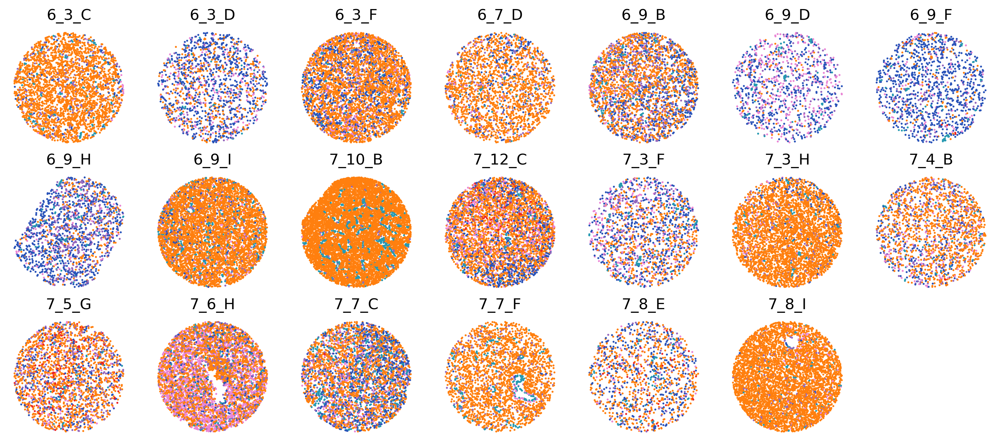

In [6]:
#Linas annotations
importlib.reload(utils)
utils.plotAll(results
              ,"cx","cy", 
        color_col="fcColorHEX",dpi=300,drawUMAP=False,grid=(3,7),
        figsize=(14,6),s=10,linewidth=0)#,ignoretitle=True)

In [7]:
importlib.reload(utils)
mygreencmp=utils.greenCMAP()
# psimg=np.linspace(0,255,256)
# repeats_array = np.tile(psimg, (50, 1))
# plt.imshow(repeats_array,cmap=mygreencmp)

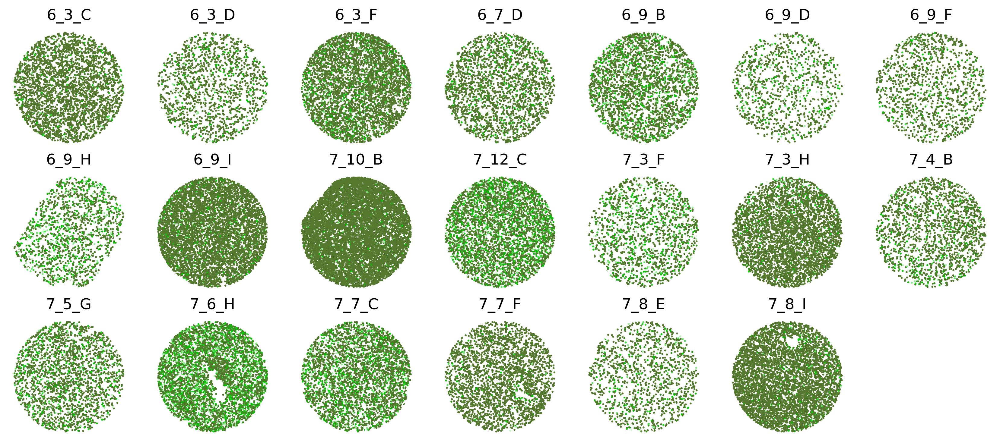

In [15]:
utils.plotAll(results,"cx","cy",
        cols=["3DUMX","3DUMY","3DUMZ"],
        color_col="QFC",cmap=mygreencmp
              ,dpi=300,grid=(3,7),
        figsize=(14,6),s=10,linewidth=0,darkbg=True)#,save=f"{classcols[i]}fcclass.png")#,ignoretitle=True)

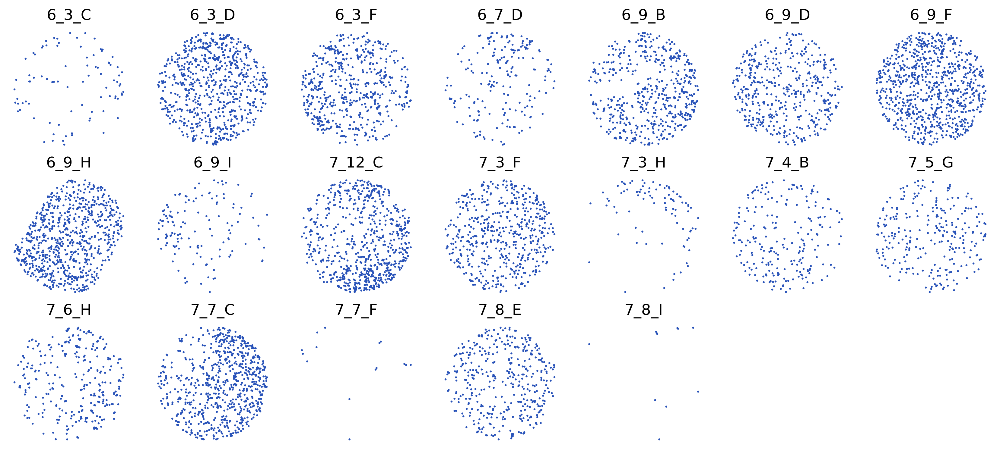

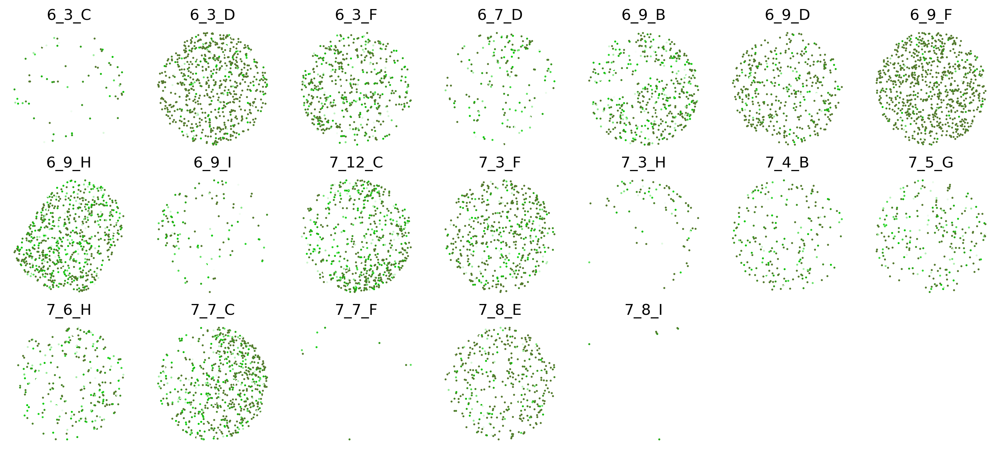

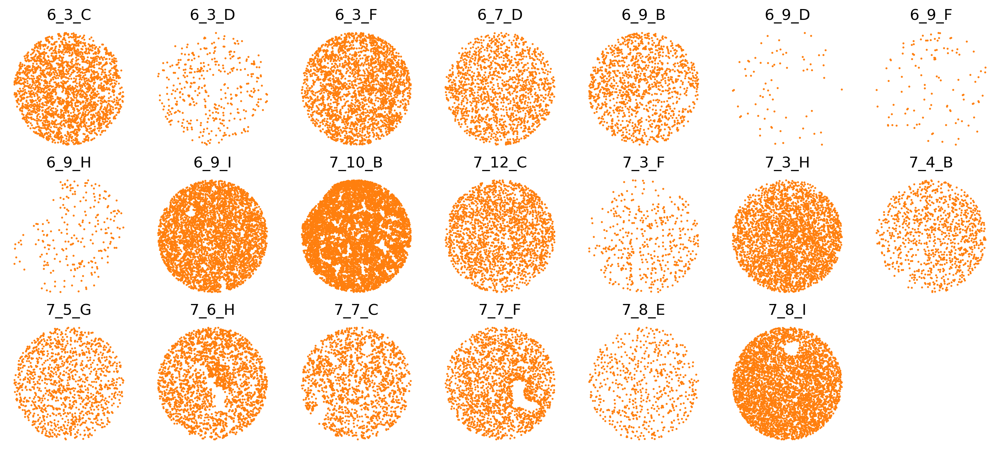

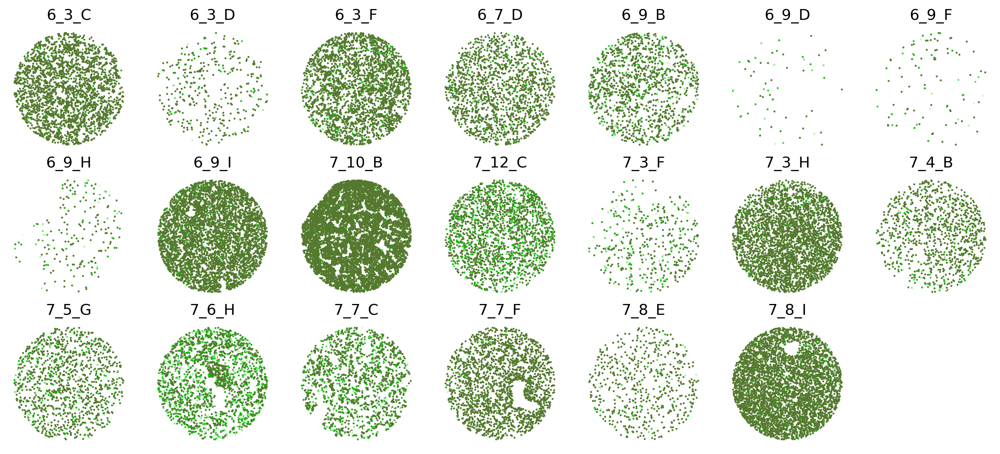

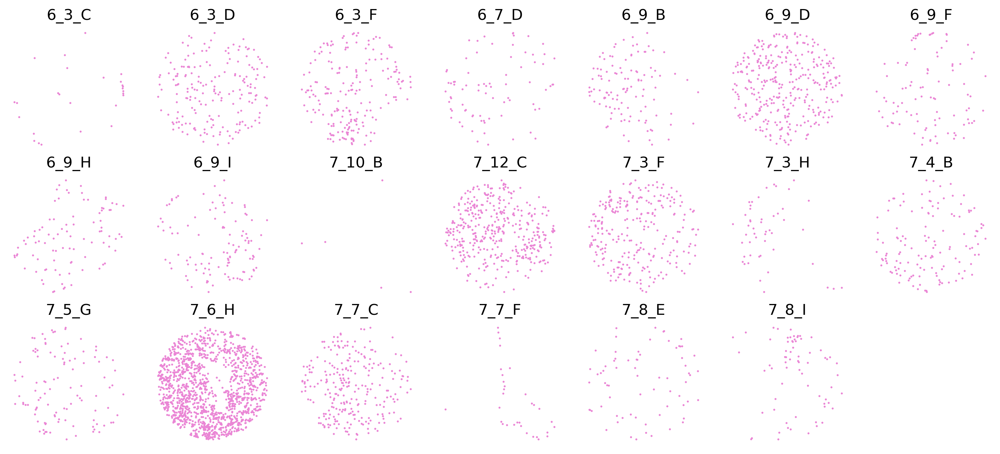

...

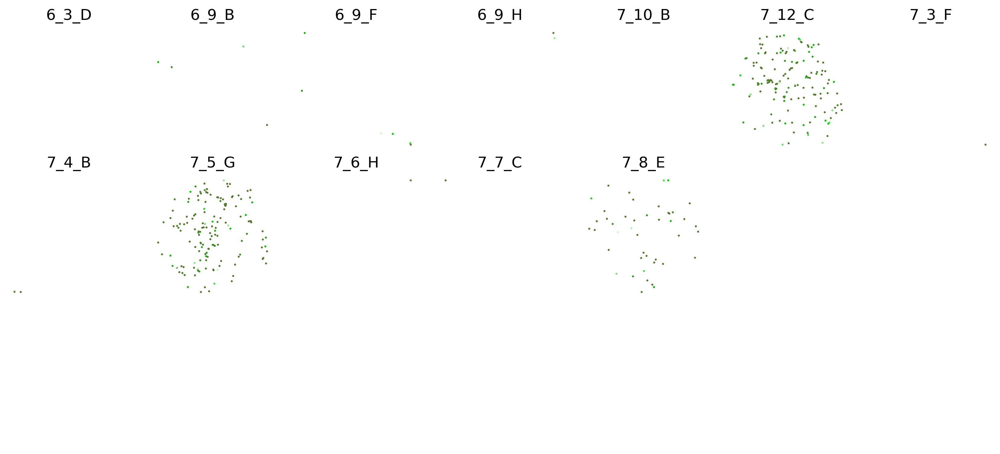

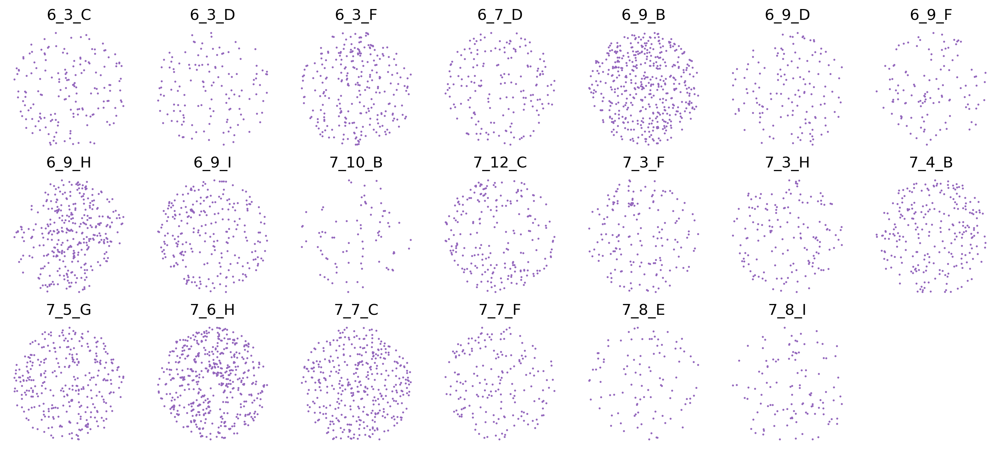

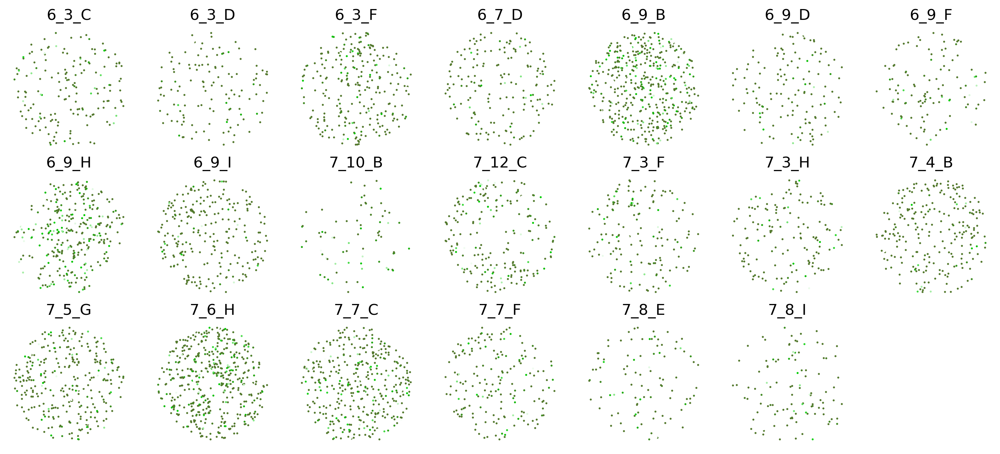

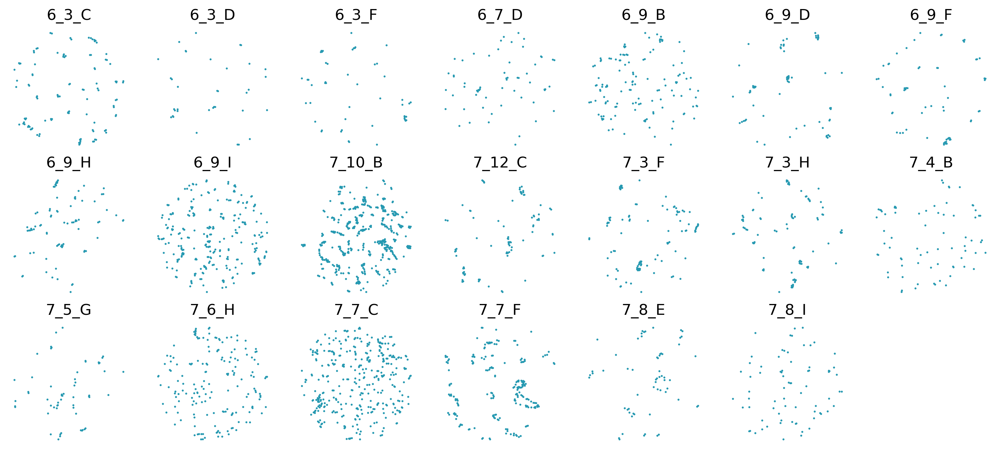

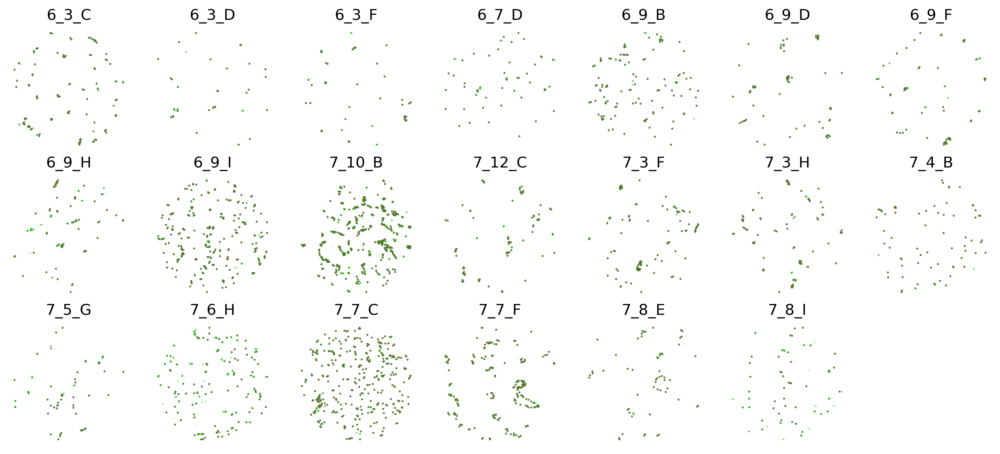

In [24]:
importlib.reload(utils)
imgloc="/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/new20cores/vis/"
for i in range(6):
    indf=results[results["fcclass"]==i]
    utils.plotAll(indf,"cx","cy",color_col="fcColorHEX",dpi=300,grid=(3,7),
        figsize=(14,6),s=10,linewidth=0,save=f"{imgloc}{classcols[i]}fcclass.png")#,ignoretitle=True)
    utils.plotAll(indf,"cx","cy",color_col="QFC",cmap=mygreencmp,dpi=300,grid=(3,7),
        figsize=(14,6),s=10,linewidth=0,save=f"{imgloc}{classcols[i]}QFC.png")

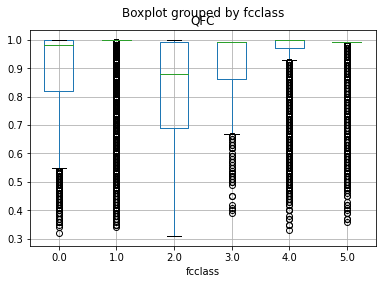

In [13]:
results.boxplot(by="fcclass",column=["QFC"])
plt.savefig("/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/new20cores/QFCin20cores.svg")


In [45]:
results["QFC"].describe()

count    53857.000000
mean         0.939113
std          0.126366
min          0.310000
25%          0.960000
50%          1.000000
75%          1.000000
max          1.000000
Name: QFC, dtype: float64

In [ ]:
# myvioletcmp=utils.purpleCMAP()
# psimg=np.linspace(0,255,256)
# repeats_array = np.tile(psimg, (50, 1))
# plt.imshow(repeats_array,cmap=myvioletcmp)

In [ ]:
# utils.plotAll(results[results["CellType"] == "ambiguous"],"cx","cy",
#         cols=["3DUMX","3DUMY","3DUMZ"],
#         color_col="QFC",cmap=myvioletcmp,dpi=300,drawUMAP=False,grid=(5,5),
#         figsize=(14,14),s=5)

In [ ]:
# #for when there are ambiguous
# utils.plotTwoSets(results[(results["ClassLabel"] != 6) & (results["Image"].isin(cores_test))],
#                   results[(results["ClassLabel"] == 6) & (results["Image"].isin(cores_test))],"QFC","QFC",
#             "cx","cy",cmap1=mygreencmp,cmap2=myvioletcmp,dpi=300,grid=(2,5),
#         figsize=(15,6))#,save="/home/leslie/Documents/Uppsala/TissueMapsAll/5papers/data/figures/newfcresults/somethin.svg")5

In [ ]:
#sns.histplot(data=penguins, x="flipper_length_mm")

## Save labels to view in qupath

In [52]:
allcores={}

def stripStr(mystr):
    mystr=mystr.replace("[","")
    mystr=mystr.replace("]","")
    mystr=mystr.replace(","," ")
    mystr=mystr.replace("{","")
    mystr=mystr.replace("}","")
    return mystr

for u in results["Image"].unique():
    allcores[u]={"allx":[],"ally":[],"allc":[],"alli":[],"allgid":[],"alllt":[]}

for i,row in results.iterrows():
    #get numpy of geometry
    mystr=row["geometry"]
    mystr=stripStr(mystr)
    myarr=np.fromstring(mystr,sep=" ")
    x=myarr[::2].tolist()
    y=myarr[1::2].tolist()
    cl=row["fcclass"]
    image=row["Image"]
    gid=row["global_id"]
    
    allcores[image]["allx"].append(x)
    allcores[image]["ally"].append(y)
    allcores[image]["allc"].append(cl)
    allcores[image]["alli"].append(image)
    allcores[image]["allgid"].append(gid)

In [ ]:
import json
for img in results["Image"].unique():
    with open(loc+"/FCtoQupath/"+img+"_FC.json", 'w') as outfile:
        json.dump(allcores[img], outfile)    
